# Data Preprocessing
- Gets the data for the selected stocks 
- Checks for problems and plots raw data
- Identifies stock splits and corrects for them as instructed by user
- Cleans data as needed
- Plots raw vs cleaned data
- Stores clean data in a new SQLite DB for further analysis

## User-defined variables
- Set path of SQLite DB file
- Pick the stocks you want to process (leave list empty if you want to examine all stocks for which data is stored in the DB)
- Adjust threshold for automatic stock split detection if needed (there is also a method below for manually entering split events)
- Adjust the minimal length of stock history to be considered for futher analysis (i.e., if a stock has been traded for much less time than the others, you might want to exclude it from your dataset)

In [1]:
symbols = ["AAPL", "ABBV", "DD", "GE", "KVUE", "TECH"] #list of stocks you want examined. 
symbols = [] #***If you want to examine all stocks in the SQLite DB, leave the symbols list empty. 
#This is recommended if you want to produce a 'clean' DB.***

overwrite_clean_tables = False #default=False: this will prevent pre-processing of data that already exists in the clean SQLite file.
#set to True if you want to reanalyze and overwrite existing tables in the clean SQLite database. 

split_ratio_threshold = 1.5 #minimal value of close/open (or open/close) price ratio that will trigger a split (or reverse split) warning. 
min_duration_ratio = 0.5 #minimal length of timeseries compared to the maximal timeseries (i.e., for removing stocks that have been traded for less than a certain duration).

#paths of SQLite DB files:
sqlite_file_path = './S&P 500.sqlite' #file containing raw data (produced by populate_SQL.py).
sqlite_file_path_clean = './S&P 500_clean.sqlite' #file that will contain only data that passed QC, and was adjusted for stock splits as required.


#### ....End of user-defined variables....

In [2]:
#import required libraries
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
from IPython.display import clear_output

In [3]:
#connection and handle for existing SQLite DB
conn = sqlite3.connect(sqlite_file_path)
cur = conn.cursor()

#connection and handle for new SQLite file containing clean data, as well as the 'Stocks' table from the original SQL DB
conn_clean = sqlite3.connect(sqlite_file_path_clean)
cur_clean = conn_clean.cursor()

## Functions:

### Import and arrange data
- If user did not define stocks to be examined, retrieve info on all stocks with data
- Import SQL data into Pandas DataFrames, and load these dfs into a dictionary

In [4]:
def get_tables_w_data() :
    """Retrieves stock symbols for which data exists in the SQL file.
    
    Returns:
        list: A sorted list containing stock symbols (str) for which data is available.    
    """      
        
    cur.execute("SELECT name FROM sqlite_master WHERE type='table' AND name != 'Stocks'")
    stock_tables = [table[0] for table in cur.fetchall()]

    if not overwrite_clean_tables : #if we don't want to process data we've already cleaned
        cur_clean.execute("SELECT name FROM sqlite_master WHERE type='table' AND name != 'Stocks'")
        existing_clean_tables = [table[0] for table in cur_clean.fetchall()]
        stock_tables = [table for table in stock_tables if table not in existing_clean_tables]
        
    tables_w_data = []
    for table in stock_tables:
        cur.execute(f"SELECT COUNT(*) FROM '{table}'")
        cnt = cur.fetchone()[0]
        if cnt > 0 :
            tables_w_data.append(table)
    print(f"Data will be retrieved from {len(tables_w_data)} tables from {sqlite_file_path}")
    return sorted(tables_w_data)

if len(symbols) == 0:
    symbols = get_tables_w_data()

Data will be retrieved from 367 tables from ./S&P 500.sqlite


In [5]:
def load_dfs_dict() :
    """Imports SQL data to Pandas DataFrames, sorts them by df.Date (ascending, for plotting), and stores these dfs in a dictionary.
    
    Returns:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).  
    """ 

    dfs = dict()
    for symbol in symbols :
        df = pd.read_sql(f"SELECT * FROM '{symbol}'", conn)
        df.sort_values('Date', inplace=True, ignore_index=True)
        dfs[symbol] = df

    print(f"Created 'dfs' dictionary - contains data on {len(dfs)} stocks.")
    return dfs   

dfs = load_dfs_dict()


Created 'dfs' dictionary - contains data on 367 stocks.


### Basic quality control
- Ensure that data types are as expected
- Plot raw data for visual inspection
- Examine lengths of datasets and remove data that is too short compared to the others (as defined by min_duration_ratio)

In [6]:
def check_dtypes(dfs, flt_series_list, int_series) :
    """Basic test to ensure that data types of dfs are as expected.

    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
    
    Returns:
        None

    Raises:
        TypeError: If series dtype not as expected. 
    """ 

    for symbol, df, in dfs.items() :
        for series in flt_series_list :
            if df[series].dtype != 'float64' :
                raise(TypeError, f"Unexpected value encountered, check series {series.name} for df of stock {symbol} - dtype should be float64.")
        if df[int_series].dtype != 'int64' :
            raise(TypeError, f"Unexpected value encountered, check series {int_series.name} for df of stock {symbol} - dtype should be int64.")
    
    print("Data types OK.")

check_dtypes(dfs, ['Open', 'Close', 'DailyChange', 'Low', 'High', 'DailyRange'], 'Volume') 

Data types OK.


In [7]:
"""Get maximum data length and corrseponding dates (for plotting of datasets with shorter timeseries using the same scale as others)."""

maxlen = max([len(df) for df in dfs.values()]) #maximum length of timeseries
for df in dfs.values():
    if len(df) == maxlen :
        date_list = df.Date.to_list() #list of dates from timeseries with maximum length
        break

In [8]:
def plot_stock_line(dfs):
    """Plot raw data (closing prices per trading day) - time axis (x) normalized for maximum duration in dataset.
    
    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
    
    Returns:
        None 
    """ 

    num_plots = len(dfs)  # one subplot per df
    num_cols = 2 if len(dfs) > 1 else 1 #2 dfs per column
    num_rows = int(np.ceil(num_plots / num_cols)) # number of rows in figure

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(7*num_cols, 3*num_rows))
    if len(dfs) > 1 :
        axes = axes.flatten()
    else : 
        axes = [axes]

    plt.suptitle("Raw Price Data for Selected Stocks", y=1)

    for ax, (symbol, df) in zip(axes, dfs.items()) :
        if len(df) < maxlen : #for shorter time series, normalize x axis to entire historical period
            nan_list = [np.nan] * (maxlen-len(df))
            close_list = nan_list + df.Close.to_list()
            ax.plot(date_list, close_list)
            ax.set_xticks(date_list)
        else :
            ax.plot(df.Date, df.Close)
        ax.set_title(symbol)
        ax.set_xlabel('Date')
        ax.set_ylabel('Stock Price (USD)')
        ax.tick_params(axis='x', labelrotation=45)
        ax.xaxis.set_major_locator(plt.MultipleLocator(maxlen // 5))

    plt.tight_layout(w_pad = 5, h_pad = 3)
    plt.show()

plot_stock_line(dfs)

In [9]:
def check_df_lens(dfs) :
    """If a dataset is too short (as defined by min_duration_ratio), it will not be stored in the 'clean' database
    and will not be considered in future analyses. 
    
    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
        
    Returns:
        dfs (dict): The modified dfs dict, without excluded data. 
    """ 

    dfs_to_remove = []

    for symbol, df in dfs.items():
        if len(df) < (maxlen * min_duration_ratio) :
            dfs_to_remove.append(symbol)

    dfs = {key: value for key, value in dfs.items() if key not in dfs_to_remove}

    if len(dfs_to_remove) > 0 :
        print(f"{len(dfs_to_remove)} datasets were found to be too short (shorter than {100*min_duration_ratio}% of longest dataset), and will be excluded from the 'clean' database : {dfs_to_remove}")
    else :
        print(f"No dataset was removed due to being too short (shorter than {100*min_duration_ratio}% of longest dataset).")

    return dfs

dfs = check_df_lens(dfs)

3 datasets were found to be too short (shorter than 50.0% of longest dataset), and will be excluded from the 'clean' database : ['CEG', 'GEHC', 'KVUE']


## Adjust data for stock splits (including reverse splits = consolidations)
- Use sudden changes in stock price (as defined by split_ratio_threshold) to automatically detect stock split events
- Create a DataFrame holding the info regarding all splits detected
- Allow user to remove or add split events as needed
- Plot adjusted data together with original data to visualize split adjustments

In [10]:
def detect_splits(dfs):
    """Finds instances of sudden changes in stock price and consider them to be split events if they exceed the split_ratio_threshold. 
    
    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
        
    Returns:
        split_df (pandas.DataFrame): A DataFrame holding info on detected split events. 
    """ 

    split_df = pd.DataFrame(columns=['Stock', 'Date', 'SplitRatio'])

    for symbol, df in dfs.items() :
        split_dates = []
        split_ratios = []
        for i in range(1, len(df.Open)) :
            if (df.Close.loc[i-1] / df.Open.loc[i]) > split_ratio_threshold :
                ratio = str(round(df.Close.loc[i-1] / df.Open.loc[i]))+":1"
            elif (df.Open.loc[i] / df.Close.loc[i-1]) > split_ratio_threshold :
                ratio = "1:"+str(round(df.Open.loc[i] / df.Close.loc[i-1]))
            else : continue
            date = df.Date.loc[i]
            split_df.loc[len(split_df)] = [symbol, date, ratio]                      
                
    return split_df

split_df = detect_splits(dfs) #find anomalies that are suspected as stock splits

In [11]:
def split_query(split_df) :
    """Get user input on split_df. 
    
    Args:
        split_df (pandas.DataFrame): A DataFrame holding info on detected split events.
        
    Returns:
        split_df (pandas.DataFrame): The (user-accepted) split events DataFrame. 
    """ 
    
    while True :      
        display(split_df)
        to_split = input('''Please examine split events data shown above. 
-To accept all split events data as-is, press ENTER. 
-To exclude rows, enter the row numbers to exclude (separated by spaces).
-To manually insert a row, enter a list containing [stock symbol, date (YYYY-MM-DD), split ratio (before:after)]\n\n''').strip()
        
        if to_split != '' :
            if to_split.startswith('[') and to_split.endswith(']'):
                additions = to_split[1:-1].split(',')
                additions = [a.upper().strip() for a in additions]
                split_df.loc[len(split_df)] = additions
                split_df.sort_values('Stock', inplace=True, ignore_index=True)                
                clear_output()
                print("***Split event added manually - please check modified split events table (sorted by stock symbol):***\n")                
            else :
                exceptions = [int(i) for i in to_split.split()]
                split_df.drop(exceptions, inplace=True)
                split_df.reset_index(drop=True, inplace=True)
                clear_output()
                print("***Exceptions removed - please check modified split events table:***\n")
        else :
            clear_output()
            print('Listed split events accepted. Data will be adjusted accordingly.\n') 
            return split_df

split_query(split_df)

Listed split events accepted. Data will be adjusted accordingly.



,Stock,Date,SplitRatio
0,AMZN,2022-06-06,20:1
1,ANET,2021-11-18,4:1
2,APA,2020-03-09,2:1
3,APH,2021-03-05,2:1
4,BLDR,2020-03-16,2:1
5,COO,2024-02-20,4:1
6,CPRT,2022-11-04,2:1
7,CPRT,2023-08-22,2:1
8,CSGP,2021-06-28,10:1
9,CSX,2021-06-29,3:1


In [12]:
def adjust_for_split(dfs, split_df) :
    """Uses info found in split_df to split-adjust data. 
    
    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
        split_df (pandas.DataFrame): A DataFrame holding info on user-accepted split events.        
        
    Returns:
        adjusted_dfs (dict): A dictionary storing all datasets in which a split adjustment was made: 
                            key = stock symbol (str), value = split-adjusted stock data (pandas.DataFrame).
    """ 

    adjusted_dfs = dict()
    columns_to_divide = ['Open', 'Close', 'Low', 'High', 'DailyRange']

    #go through all rows of split_df and adjust trading data from dfs as necessary
    for index, row in split_df.iterrows() : 
        symbol = row.Stock
        split_date = row.Date
        ratio_num1, ratio_num2 = row.SplitRatio.split(':')
        split_ratio = float(ratio_num1) / float(ratio_num2)

        if symbol not in adjusted_dfs :
            adj_df = dfs[symbol].copy()
        else :
            adj_df = adjusted_dfs[symbol]

        adj_df.loc[adj_df.Date < split_date, columns_to_divide] /= split_ratio
        adj_df.loc[adj_df.Date < split_date, 'Volume'] *= split_ratio

        adjusted_dfs[symbol] = adj_df #store split-adjusted data

    print(f"Data has been split-adjusted for the following stocks : {list(adjusted_dfs.keys())}")

    return adjusted_dfs

adjusted_dfs = adjust_for_split(dfs, split_df)             

Data has been split-adjusted for the following stocks : ['AMZN', 'ANET', 'APA', 'APH', 'BLDR', 'COO', 'CPRT', 'CSGP', 'CSX', 'DXCM', 'EW', 'FANG', 'FAST', 'FTNT', 'GEN', 'GOOG', 'GOOGL', 'ISRG', 'MCHP', 'MKC', 'MNST', 'MRO', 'NDAQ', 'NEE', 'NVDA', 'OXY', 'PANW', 'PAYC', 'PCAR']


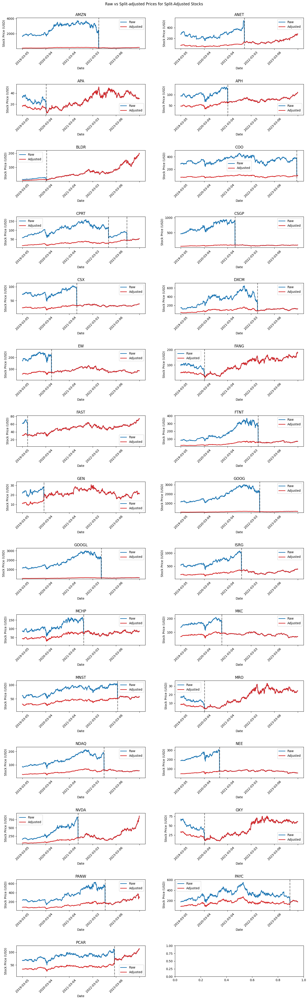

In [13]:
def plot_stock_splits(adjusted_dfs, dfs, split_df):
    """Visualizes split adjustments. 
    
    Args:
        adjusted_dfs (dict): A dictionary storing all datasets in which a split adjustment was made: 
                            key = stock symbol (str), value = split-adjusted stock data (pandas.DataFrame).
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
                        Used for showing raw data compared to split-adjusted data.
        split_df (pandas.DataFrame): A DataFrame holding info on user-accepted split events.        
        
    Returns:
        None
    """ 

    num_plots = len(adjusted_dfs)  # one subplot per df
    num_cols = 2 if len(adjusted_dfs) > 1 else 1 #2 dfs per column
    num_rows = int(np.ceil(num_plots / num_cols)) # number of rows in figure

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(7*num_cols, 3*num_rows))
    if len(adjusted_dfs) > 1 :
        axes = axes.flatten()
    else : 
        axes = [axes]

    plt.suptitle("Raw vs Split-adjusted Prices for Split-Adjusted Stocks", y=1)

    for ax, symbol in zip(axes, adjusted_dfs) :
        max_y = max(dfs[symbol].Close.max(), adjusted_dfs[symbol].Close.max())*1.1        
        lw=2
        ax.plot(dfs[symbol].Date, dfs[symbol].Close, color='tab:blue', lw=lw, label='Raw')
        ax.plot(adjusted_dfs[symbol].Date, adjusted_dfs[symbol].Close, color='tab:red', lw=lw, label='Adjusted') 
        split_dates = [split_date for split_date in split_df.loc[split_df.Stock == symbol, 'Date']] #there might be multiple splits per stock during the period
        for date in split_dates:            
            ax.plot([date,date], [0,max_y], color='black', linestyle='--', alpha=0.5, lw=lw) #vertical line to indicate split event
        ax.legend()
        ax.set_title(symbol)
        ax.set_xlabel('Date')
        ax.set_ylabel('Stock Price (USD)')
        ax.set_ylim(top=max_y, bottom=dfs[symbol].Close.min()*0.1 )
        ax.tick_params(axis='x', labelrotation=45)
        ax.xaxis.set_major_locator(plt.MultipleLocator(len(df) // 5))

    plt.tight_layout(w_pad = 5, h_pad = 3)
    plt.show()

plot_stock_splits(adjusted_dfs, dfs, split_df)

 ## Store 'clean' data in the appropriate SQLite DB
- It is recommended to pre-process all tables from the original SQLite DB, and then store all 'clean' in a new SQLite file
- Depending on the value set for replace_existing_tables (True/False), the data in the new SQLite file will be overwritten
- The new SQLite file will contain split-adjusted data when a split was detected, or the raw data if not 

In [14]:
def copy_stocks_table():
    """If the clean SQLite DB doesn't contain our 'Stocks' table, add it.
    
    Args:
        None
        
    Returns:
        None
    """ 

    cur_clean.execute("SELECT name FROM sqlite_master WHERE type='table' AND name='Stocks'")
    isstocks = cur_clean.fetchone()    
    
    if isstocks is not None: 
        print(f"'Stocks' table already exists in {sqlite_file_path_clean}.")
        return #if the table already exists, exit this function
        
    try:
        #get the schema of the source table
        cur.execute("SELECT sql FROM sqlite_master WHERE type='table' AND name='Stocks'")
        create_table_sql = cur.fetchone()[0]
        
        #create the table in the clean database
        cur_clean.execute(create_table_sql)
        
        #copy data from source table to destination table
        cur.execute("SELECT * FROM Stocks")
        rows = cur.fetchall()
        cur_clean.executemany(f"INSERT INTO Stocks VALUES ({','.join(['?'] * len(rows[0]))})", rows)
        conn_clean.commit()
        print(f"'Stocks' table successfully copied to {sqlite_file_path_clean}.")
    
    except sqlite3.Error as e:
        print("Error:", e)
        conn_clean.rollback()

copy_stocks_table()

'Stocks' table already exists in ./S&P 500_clean.sqlite.


In [15]:
#enter clean data into clean SQLite DB
def store_clean_data(dfs, adjusted_dfs) :
    """Store data for all pre-processed stocks in clean SQLite DB.
    
    Args:
        dfs (dict): A dictionary storing all datasets under consideration: key = stock symbol (str), value = stock data (pandas.DataFrame).
        adjusted_dfs (dict): A dictionary storing all datasets in which a split adjustment was made: 
                            key = stock symbol (str), value = split-adjusted stock data (pandas.DataFrame).                        
        
    Returns:
        None
    """ 

    for symbol, df in dfs.items() :
        try:
                
            if symbol in adjusted_dfs :
                adjusted_dfs[symbol].sort_values('Date', ascending=False).to_sql(symbol, conn_clean, index=False, if_exists='replace')
            else :
                dfs[symbol].sort_values('Date', ascending=False).to_sql(symbol, conn_clean, index=False, if_exists='replace')

        except sqlite3.Error as e:
            print(f"Error encountered for table '{symbol}'' :\n{e}")        

    conn_clean.commit()
    print(f"Inserted {len(dfs)} tables, including {len(adjusted_dfs)} split-adjusted tables into '{sqlite_file_path_clean}'.")  


store_clean_data(dfs, adjusted_dfs)

Inserted 364 tables, including 29 split-adjusted tables into './S&P 500_clean.sqlite'.


In [16]:
#close connections to SQLite files
conn.close()
conn_clean.close()